**BMEN4480**

**Assignment 2**

**Michelle Campoli (mec2308)**

In [ ]:
# MOUNTING GOOGLE DRIVE WHERE DATA IS STORED
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


In [ ]:
#Imports
import gc
import os

import shutil
import tarfile
import numpy as np
import pandas as pd
!pip install scanpy
!pip3 install leidenalg
!pip3 install louvain
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.io as sio
from scipy.io import mmread
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.neighbors import KNeighborsClassifier

sc.set_figure_params(figsize=(6, 6))
sc.settings.verbosity = 3

In [ ]:
# open file
directory = '/gdrive/My Drive/Statistical ML/Homework 2/'
filename = "pbmc_6Kcells_500genes.txt"
adata = sc.read_text(directory+filename)
print(adata)

AnnData object with n_obs × n_vars = 501 × 6825


In [ ]:
# add metrics to dataframe
sc.pp.calculate_qc_metrics(adata, inplace= True)

/usr/local/lib/python3.7/dist-packages/scanpy/preprocessing/_qc.py:422: RuntimeWarning: invalid value encountered in true_divide
  return values / sums[:, None]


In [ ]:
# Exploring data
# cell data
adata.obs.head()

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
CELLID,6825,8.828494,28687016.0,17.171955,1.455530,2.900183,5.759072,14.084417
A1BG,1245,7.127694,1471.0,7.294377,9.313392,16.111489,28.959891,49.354181
A1BG-AS1,127,4.852030,127.0,4.852030,39.370079,78.740157,100.000000,100.000000
A2M-AS1,266,5.587249,300.0,5.707110,28.000000,44.666667,78.000000,100.000000
AAMDC,321,5.774552,350.0,5.860786,22.571429,36.857143,65.428571,100.000000


In [ ]:
adata.obs_names

Index(['CELLID', 'A1BG', 'A1BG-AS1', 'A2M-AS1', 'AAMDC', 'AAR2', 'AARD',
       'AARS', 'AARSD1', 'AASDH',
       ...
       'VAMP2', 'VAMP8', 'VCAN', 'VIM', 'XBP1', 'YBX1', 'ZFAS1', 'ZFP36',
       'ZFP36L1', 'ZFP36L2'],
      dtype='object', length=501)

In [ ]:
# gene data
adata.var.head()

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
0,249,4.115768,1.632328,50.299401,2062.0,7.631917
1,298,7.379241,2.125757,40.518962,3697.0,8.215548
2,288,8.530938,2.254543,42.514970,4274.0,8.360539
3,263,5.457086,1.865178,47.504990,2734.0,7.913887
4,270,5.045908,1.799382,46.107784,2528.0,7.835579


In [ ]:
adata.var_names

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '6815', '6816', '6817', '6818', '6819', '6820', '6821', '6822', '6823',
       '6824'],
      dtype='object', length=6825)

In [ ]:
# data output from file
adata.X

array([[4.000e+00, 1.300e+01, 1.600e+01, ..., 8.240e+03, 8.273e+03,
        8.294e+03],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 4.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [2.000e+00, 1.000e+00, 2.000e+00, ..., 0.000e+00, 0.000e+00,
        2.000e+00],
       [0.000e+00, 1.000e+00, 2.000e+00, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       [0.000e+00, 1.000e+00, 5.000e+00, ..., 3.000e+00, 3.000e+00,
        1.000e+01]], dtype=float32)

In [ ]:
# more understanding of dataframe
adata.to_df().head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,6785,6786,6787,6788,6789,6790,6791,6792,6793,6794,6795,6796,6797,6798,6799,6800,6801,6802,6803,6804,6805,6806,6807,6808,6809,6810,6811,6812,6813,6814,6815,6816,6817,6818,6819,6820,6821,6822,6823,6824
CELLID,4.0,13.0,16.0,23.0,27.0,31.0,36.0,37.0,41.0,45.0,46.0,58.0,65.0,77.0,83.0,90.0,96.0,108.0,116.0,117.0,119.0,121.0,123.0,145.0,165.0,176.0,193.0,196.0,206.0,213.0,218.0,222.0,223.0,245.0,249.0,251.0,260.0,262.0,268.0,276.0,...,5692.0,5722.0,5879.0,5914.0,5946.0,5948.0,6120.0,6145.0,6272.0,6455.0,6471.0,6475.0,6518.0,6572.0,6624.0,6669.0,6789.0,6794.0,6837.0,7148.0,7291.0,7343.0,7402.0,7460.0,7528.0,7613.0,7672.0,7781.0,7793.0,7856.0,7926.0,8045.0,8062.0,8065.0,8155.0,8189.0,8227.0,8240.0,8273.0,8294.0
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,0.0
A1BG-AS1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2M-AS1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
AAMDC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# **Question 1.a.**
Normalize the data by scaling to median library size and log transform the normalized data and perform PCA, followed by t-SNE or UMAP on the top 20 PCs. Plot the 2D or 3D embedding.

In [ ]:
# normalize data
adata.layers["counts"] = adata.X.copy() #preserve counts
sc.pp.normalize_total(adata, target_sum=None)

normalizing counts per cell
    finished (0:00:00)


/usr/local/lib/python3.7/dist-packages/scanpy/preprocessing/_normalization.py:182: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [ ]:
# log transform
sc.pp.log1p(adata)
adata.raw = adata

computing PCA
    with n_comps=2
    finished (0:00:00)


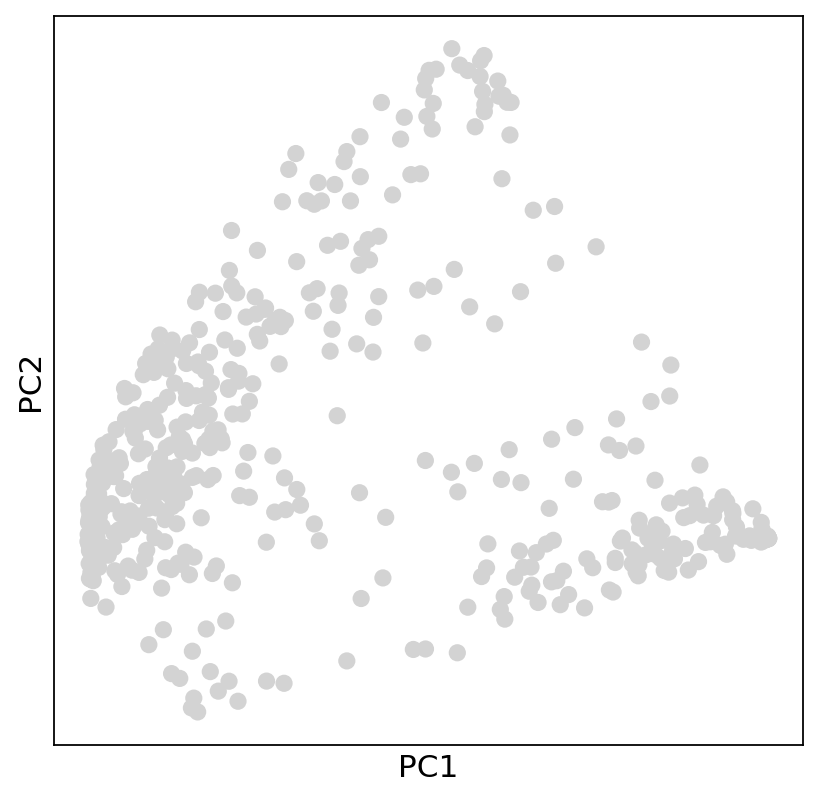

array([0.23252803, 0.12895964], dtype=float32)

In [ ]:
# PCA -- 2 principal components
sc.tl.pca(adata, n_comps = 2)
sc.pl.pca(adata)

# variance ratios
adata.uns['pca']['variance_ratio']

In [ ]:
# total variance accounted for with 2 principal components
adata.uns['pca']['variance_ratio'].sum()

0.3614877

The Variance ratios are [0.23252793, 0.12895969] for principal component 1 and 2, respectively.

In [ ]:
# PCA -- 20 principal components
sc.tl.pca(adata, n_comps = 20)

computing PCA
    with n_comps=20
    finished (0:00:00)


In [ ]:
sc.pl.pca(adata, components="all")

In [ ]:
# variance ratios
adata.uns['pca']['variance_ratio']

array([0.23252818, 0.12895969, 0.04903973, 0.03065701, 0.00844455,
       0.00735999, 0.00647851, 0.00535179, 0.0044673 , 0.00418035,
       0.00402829, 0.00392926, 0.00380462, 0.00376503, 0.00375513,
       0.00372105, 0.00365731, 0.00360695, 0.00359425, 0.00354582],
      dtype=float32)

In [ ]:
# total variance accounted for with 20 principal components
adata.uns['pca']['variance_ratio'].sum()

0.5148748

The Variance Ratios are [0.23252808, 0.12895963, 0.04903975, 0.03065705, 0.00844455, 0.00735999, 0.00647852, 0.0053518 , 0.0044673 , 0.00418035, 0.00402829, 0.00392926, 0.00380462, 0.00376503, 0.00375513, 0.00372105, 0.00365731, 0.00360696, 0.00359425, 0.00354582] for all 20 principal components.

In [ ]:
# UMAP
sc.pp.neighbors(adata, n_pcs= 20)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 20


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


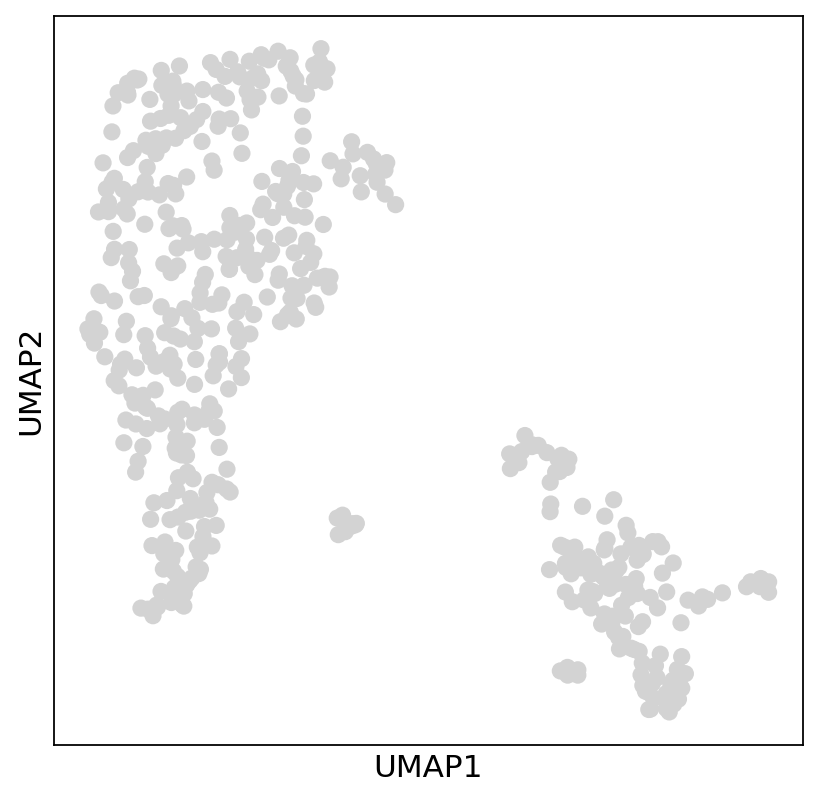

In [ ]:
sc.pl.umap(adata)

computing tSNE
    using 'X_pca' with n_pcs = 20
    using sklearn.manifold.TSNE


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:03)


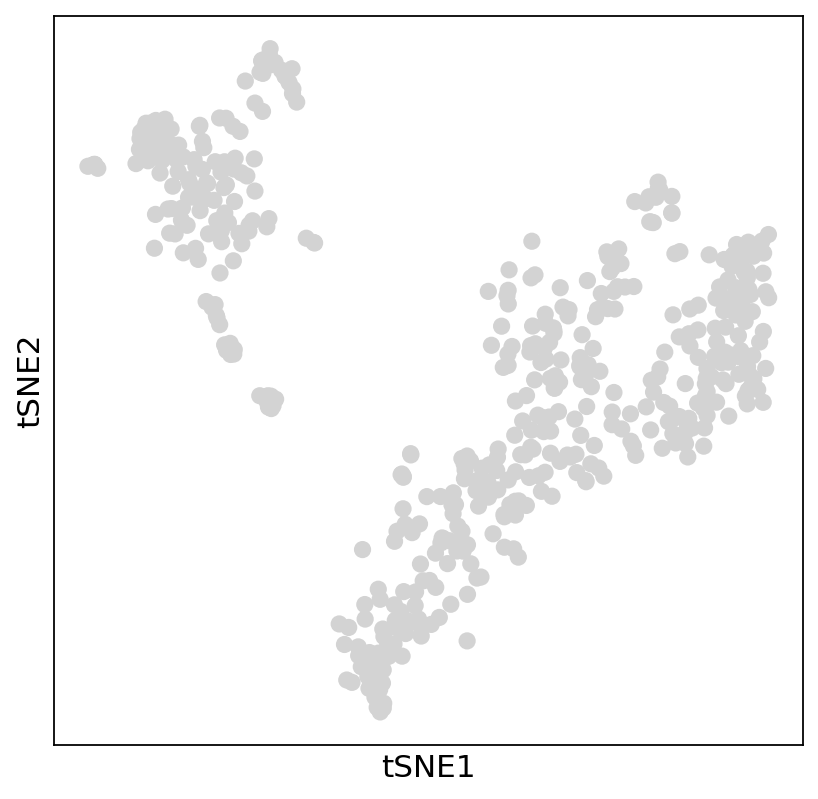

In [ ]:
# t-SNE
sc.tl.tsne(adata, n_pcs= 20)
sc.pl.tsne(adata)

# **Question 1.b.**
Is 20 a good choice for the number of PCs?

computing PCA
    with n_comps=3
    finished (0:00:00)


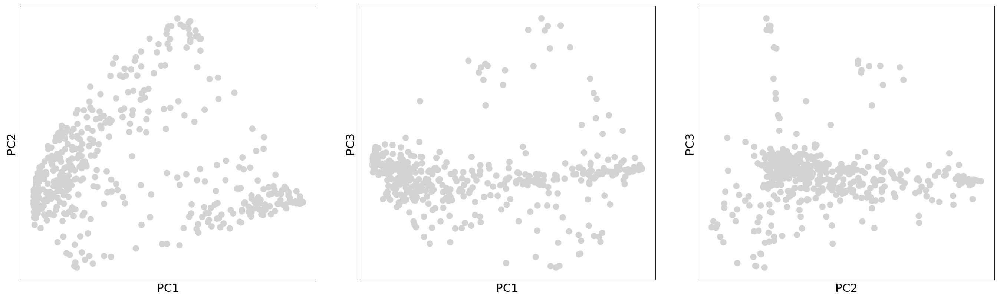

array([0.23252803, 0.12895964, 0.04903979], dtype=float32)

In [ ]:
# PCA-- 3 principal components
sc.tl.pca(adata, n_comps = 3)
sc.pl.pca(adata, components="all")
adata.uns['pca']['variance_ratio']

In [ ]:
# total variance accounted for with 3 PCs
adata.uns['pca']['variance_ratio'].sum()

0.41052747

PCA is used to reduce the number of dimensions (features) in a dataset. Above, I plotted the first two principal components, 20 principal components, and 3 principal components. Finding clusters in the dataset is the goal, and using 2 principal components split the dataset vaguely into 2 or 3 clusters. The sum of the variance ratios for 2 principal components is 0.3615. This means with only the first two principal components, 36% of the variance in the data was captured. 

The sum for 20 is 0.5148747. This means with 20 principal components, 51% of the variance in the data was captured. Looking at the array of variance ratios for each principal component:

[0.23252808, 0.12895963, 0.04903975, 0.03065705, 0.00844455,
       0.00735999, 0.00647852, 0.0053518 , 0.0044673 , 0.00418035,
       0.00402829, 0.00392926, 0.00380462, 0.00376503, 0.00375513,
       0.00372105, 0.00365731, 0.00360696, 0.00359425, 0.00354582]

We can see that up until the 4th PC, most of the variance is captured. Then the remaining PC's 5-20 are picking up on very little variance (<0.8%). 

Then when looking at 3 principal component variance ratios, they sum to 0.41052738. So 41% of the variance in the dataset is captured by 3 principal components. The difference between 3 PCs and 20 PCs is only 10%. 

Therefore, 20 principal components is not a good choice for the number of PCs. It is overkill because a 20-D graph is not easily interpretable and the computations are much more expensive for only a small increase in the capture of variance. Working with 3 or 4 PCs is enough. 

# **Question 2.**
Cluster cells using the K-means method and color the embedding from Q1 with cluster IDs. Justify your choice of K.

In [ ]:
# where is pca, umap, and tsne data stored: data.obsm
adata

AnnData object with n_obs × n_vars = 501 × 6825
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'tsne'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'kmeans2' as categorical
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'kmeans5' as categorical
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Catego

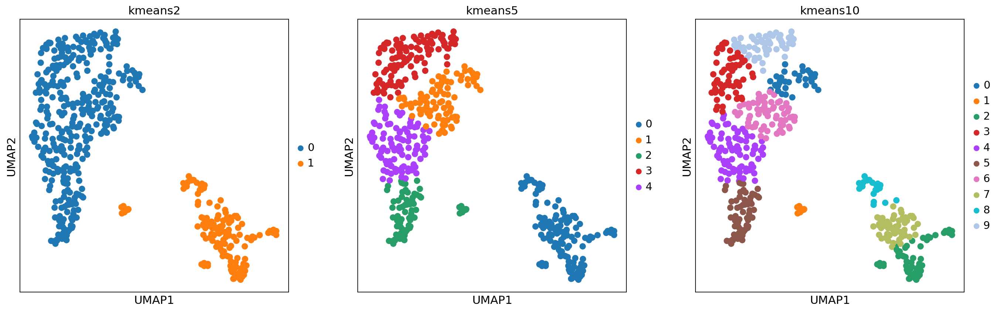

In [ ]:
# Cluster cells using K-means method 

#X_pca = adata.obsm['X_pca']
X_umap = adata.obsm['X_umap']
#X_tsne = adata.obsm['X_tsne']

# kmeans with k= 2
kmeans = KMeans(init= "k-means++", n_clusters=2, random_state=0).fit(X_umap) 
adata.obs['kmeans2'] = kmeans.labels_.astype(str)

# kmeans with k= 5
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_umap) 
adata.obs['kmeans5'] = kmeans.labels_.astype(str)

# kmeans with k= 10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_umap) 
adata.obs['kmeans10'] = kmeans.labels_.astype(str)

sc.pl.umap(adata, color=['kmeans2', 'kmeans5', 'kmeans10'])

My choice of K would be k=2. There are two major groups visible on the umap that can be two distinct clusters. 

# **Question 3**
Compute a 30-NN (nearest neighbor) graph between cells. Plot a heatmap of the adjacency matrix for the graph. Justify your distance metric.

computing PCA
    with n_comps=20
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


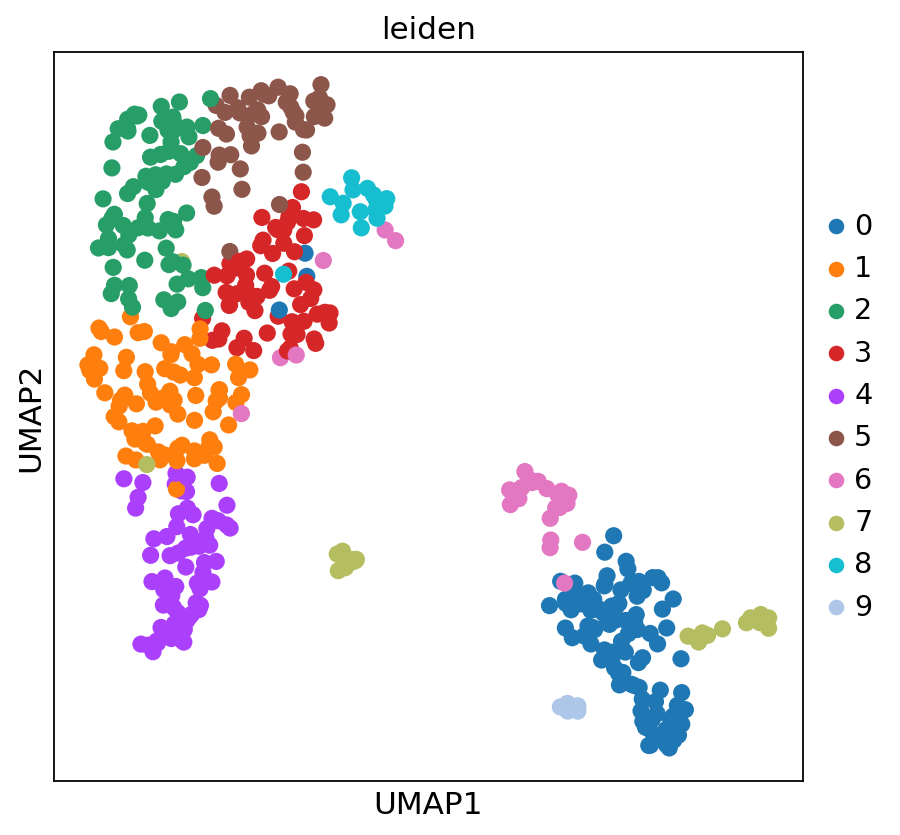

In [ ]:
# 30-KNN graph, cosine distance
sc.tl.pca(adata, n_comps = 20)
sc.pp.neighbors(adata, n_neighbors= 30, n_pcs= 20, knn= True, metric= 'cosine')
sc.tl.leiden(adata)
sc.pl.umap(adata, color= ['leiden'])

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


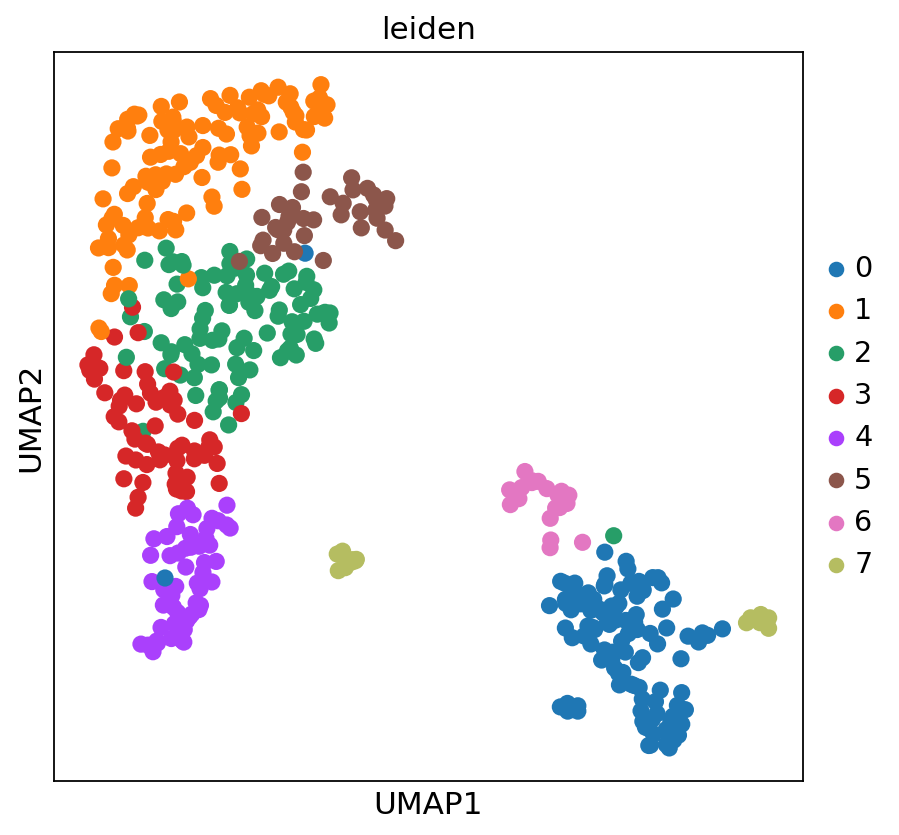

In [ ]:
# 30-KNN graph, manhattan distance
sc.pp.neighbors(adata, n_neighbors= 30, n_pcs= 20, knn= True, metric= 'manhattan')
sc.tl.leiden(adata)
sc.pl.umap(adata, color= ['leiden'])

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


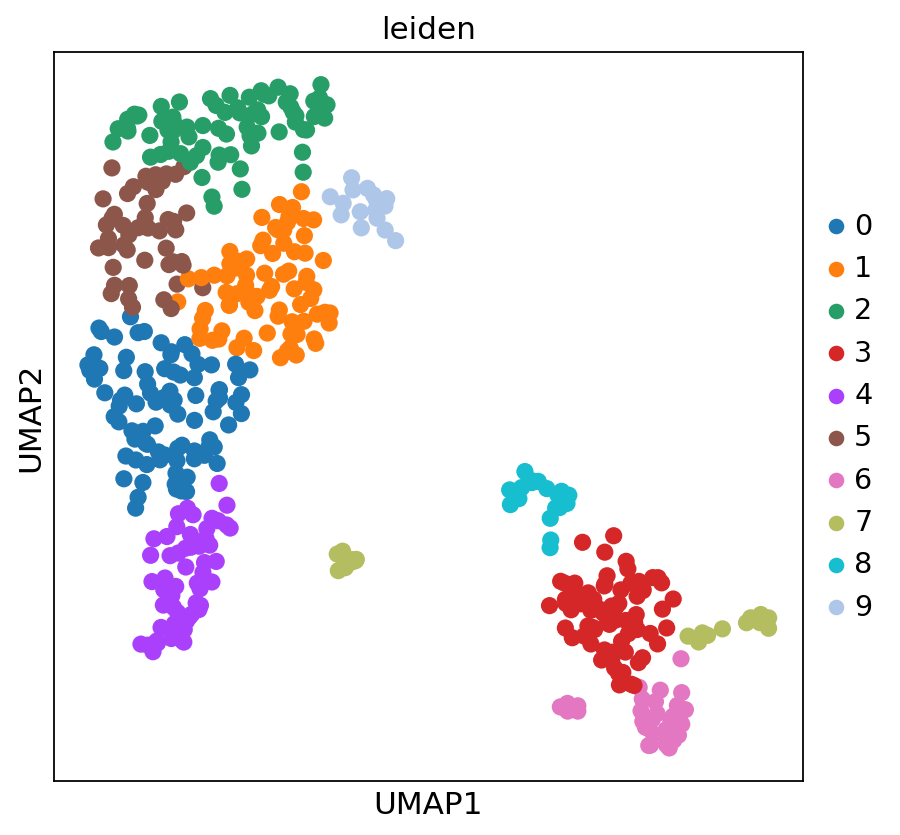

In [ ]:
# 30-KNN graph, euclidean distance
sc.pp.neighbors(adata, n_neighbors= 30, n_pcs= 20, knn= True, metric= 'euclidean')
sc.tl.leiden(adata)
sc.pl.umap(adata, color= ['leiden'])

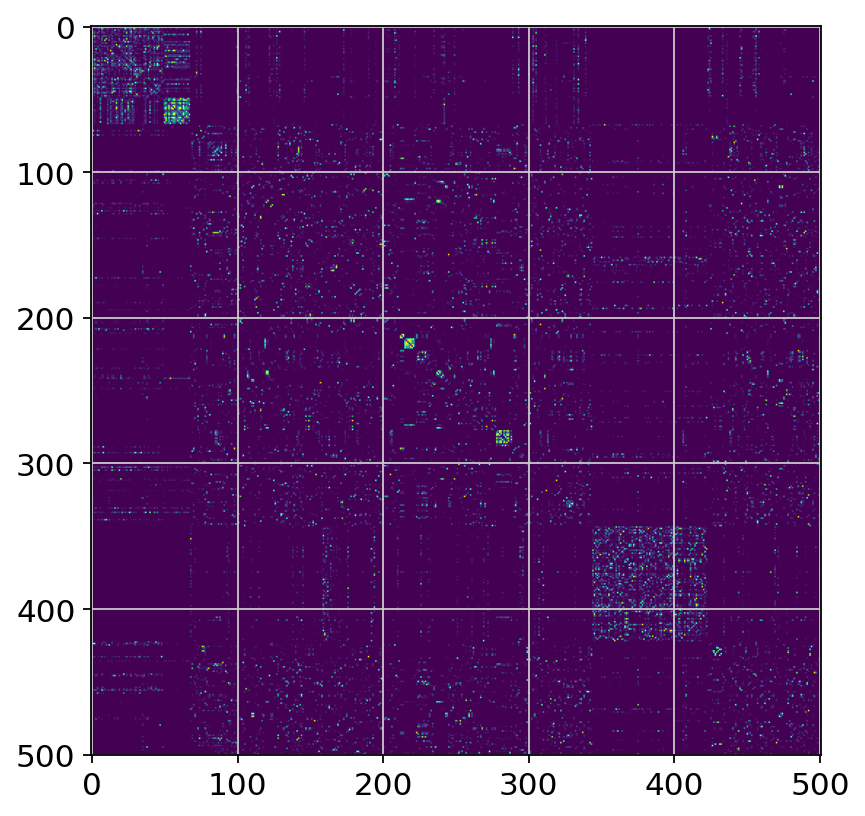

In [ ]:
# Heatmap of adjacency matrix
matrix = adata.obsp['connectivities']
heat_map = matrix[:,:].todense()
plt.imshow(heat_map, cmap= 'viridis')
plt.show()

I decided to go with the euclidean distance metric because clusters were the most well defined. 

# **Question 4**
Cluster cells using a graph-based algorithm such as Louvain with the kNN graph from Q3. Color the embedding with cluster IDs. How does it compare to K-means?

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 4 clusters and added
    'louvain_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 3 clusters and added
    'louvain_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain_1.4', the cluster labels (adata.obs, categorical) (0:00:00)


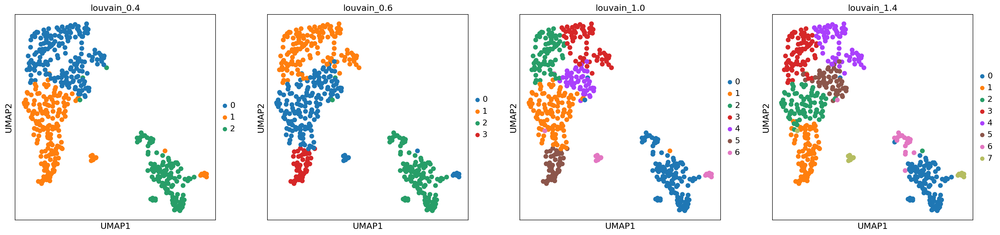

In [ ]:
sc.pp.neighbors(adata, n_neighbors= 30, n_pcs= 20, knn= True, metric= 'euclidean')
sc.tl.louvain(adata, key_added = "louvain_1.0") # default resolution in 1.0
sc.tl.louvain(adata, resolution = 0.6, key_added = "louvain_0.6")
sc.tl.louvain(adata, resolution = 0.4, key_added = "louvain_0.4")
sc.tl.louvain(adata, resolution = 1.4, key_added = "louvain_1.4")

sc.pl.umap(adata, color=['louvain_0.4', 'louvain_0.6', 'louvain_1.0','louvain_1.4'])

For louvain clustering, higher resolution means finding more and smaller clusters. The default, resolution= 1.0, found 7 clusters. At louvain standard resolution there are some clusters that contain datapoints from other clusters, such as purple&blue. Compared to k means clustering, the clusters are split differently. At low resolution louvain did not separate the two visibily obvious clusters well, meanwhile k means did (into two clusters, left and right). The first louvain graph shows three clusters and the green&orange clusters overlap as well as the blue&green clusters. Therefore I would say k means worked better at defining clusters since there were no datapoints mixed between clusters, at least from visually looking at the graph.

# **Question 5**

**Question 5.a.**
Perform a t-test to find differentially expressed genes (DEGs) in a cluster of your choice. Color the embedding with the expression of the top 5 DEGs.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


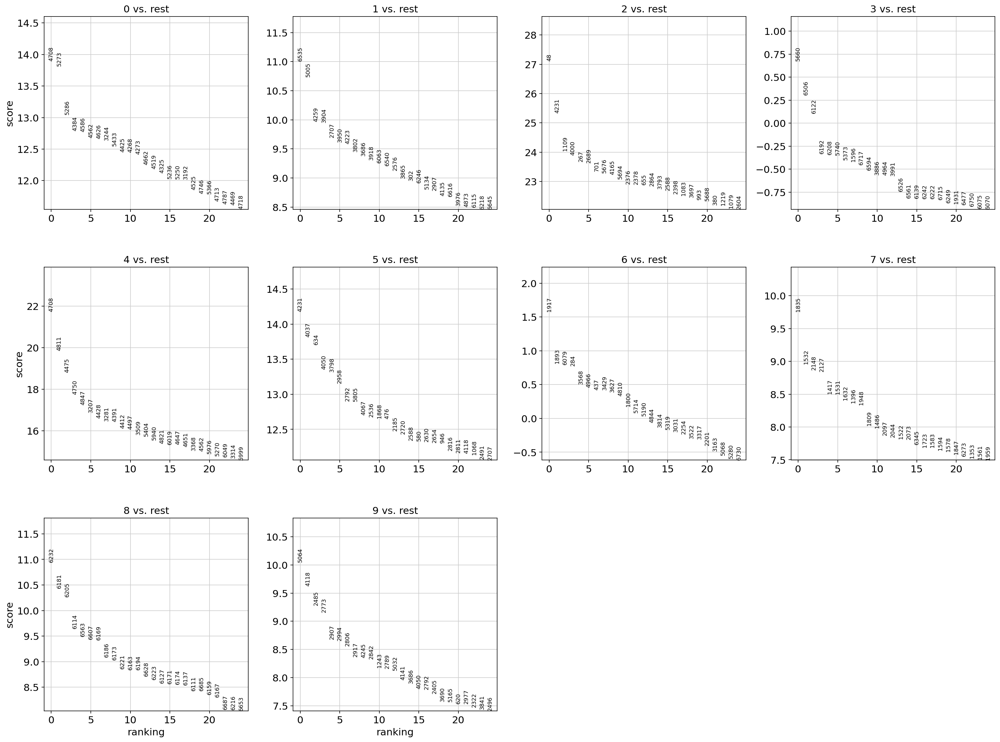

In [ ]:
# Perform a t-test to find differentially expressed genes (DEGs) in a cluster of your choice.
# T-test performed on 30-KNN graph, euclidean distance, using leiden. There are 9 clusters total. This test compares each cluster to the rest.
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In these t-test plots, the higher the score the more dissimilar the genes in the cluster of choice are from all the other clusters. The highest score appears in cluster 2. The top 5 DEGs in this cluster are 48, 4231, 1109, 4000, and 267.

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


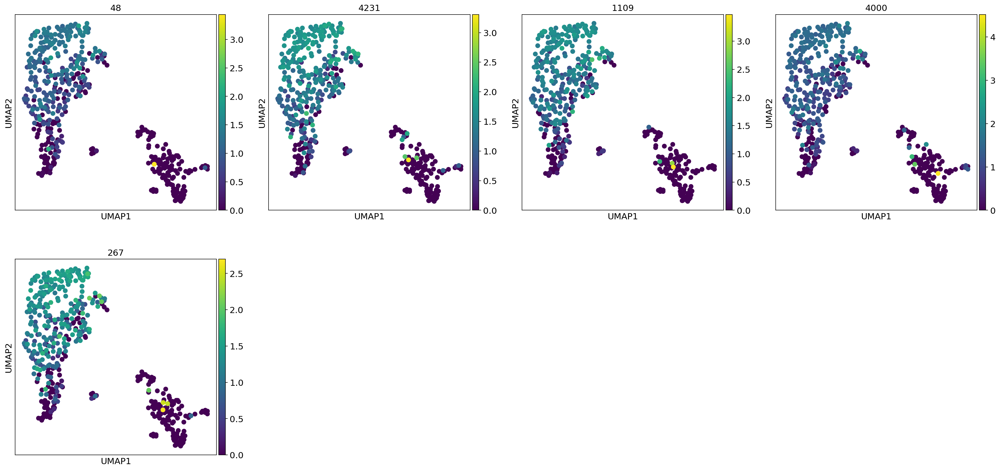

In [ ]:
# 30-KNN graph, euclidean distance
sc.pp.neighbors(adata, n_neighbors= 30, n_pcs= 20, knn= True, metric= 'euclidean')
sc.tl.leiden(adata)
sc.pl.umap(adata, color= ['48', '4231', '1109', '4000', '267'])

**Question 5. b.**
How would you characterize the cluster?


From the scores of the t-test, cluster 2 is most dissimilar based on gene expression compared to the rest of the clusters. The t-test scores were highest for the top 25 genes in cluster 2 (with scores ranging from 22 to 28). For clusters with scores close to 0, this means the genes expressed in those clusters are similar to other clusters. 


**Question 5.c.**
Which other differential expression method might be appropriate for the expression distribution in this data?

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


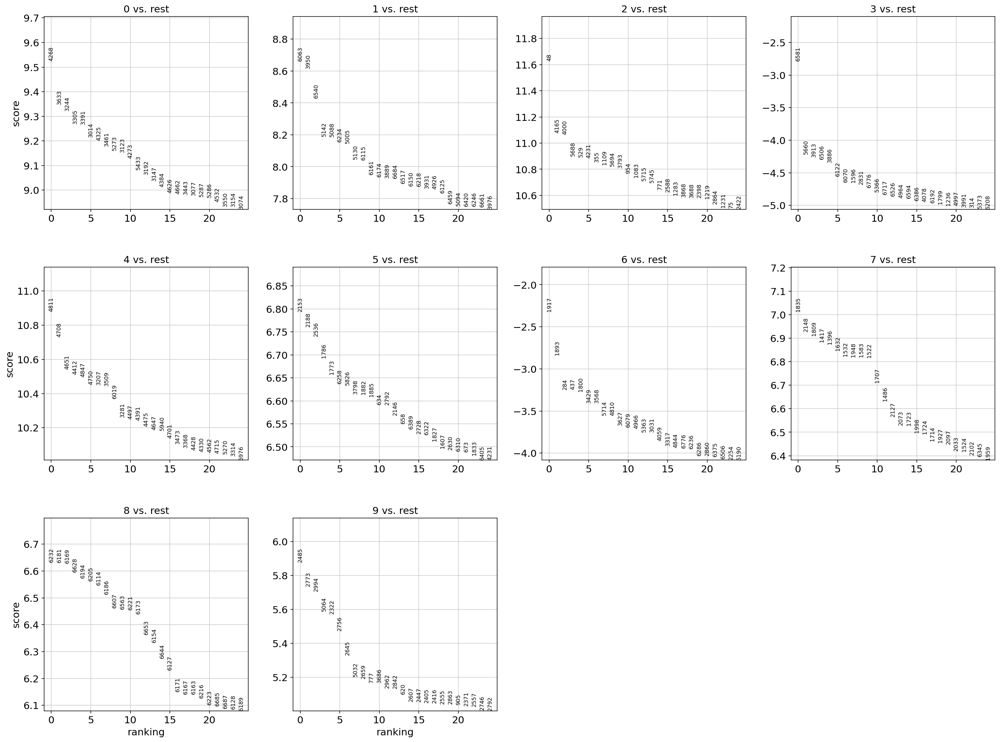

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Using a Wilcoxon rank sum test might be appropriate for the expression distribution in this data. The wilcoxon is a non-parametric test and does not assume a normally distributed dataset. It is based on ranks rather than on actual values. It is more appropriate when data is not normally distributed. We can see from these plots that scores are similar but less extreme than the t-tests. 